VIDEO TRAFICO


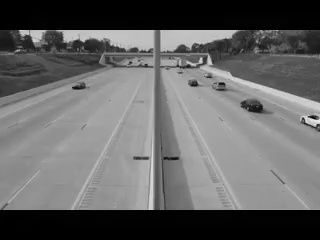

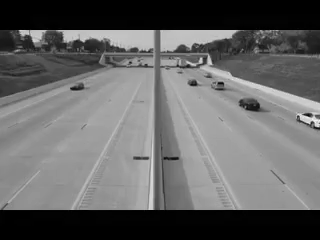

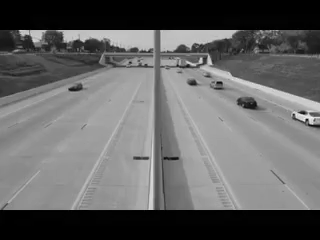

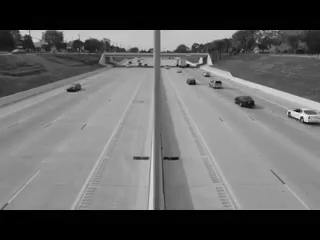

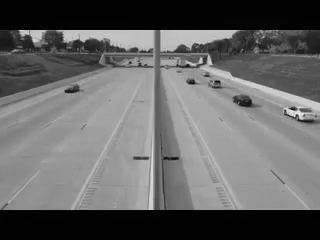

...

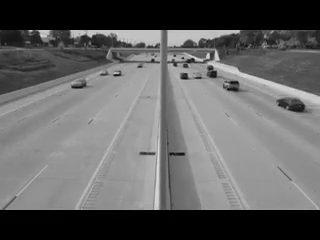

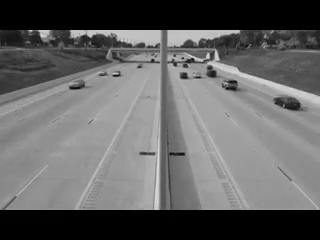

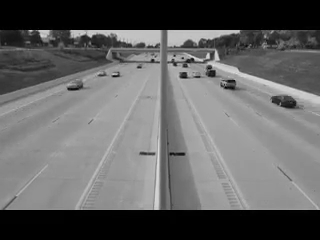

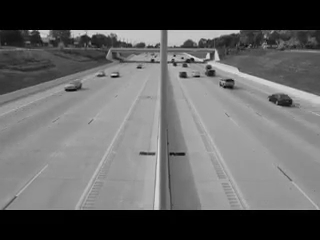

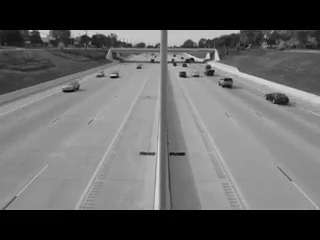

Can't receive frame (stream end?). Exiting ...


In [25]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
cap = cv.VideoCapture('videocochescorto.mp4')
while cap.isOpened():
    ret, frame = cap.read()
    # if frame is read correctly ret is True
    if not ret:
        print("Can't receive frame (stream end?). Exiting ...")
        break
    gray = cv.cvtColor(frame, cv.COLOR_BGR2GRAY)
    cv2_imshow(gray)
    if cv.waitKey(1) == ord('q'):
        break
cap.release()
cv.destroyAllWindows()

15 segundos de video por 30 frames

In [53]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from skimage.transform import resize
from IPython.display import HTML


subractor = cv.bgsegm.createBackgroundSubtractorMOG()
Brush = np.ones((3,3),np.uint8)

def display_video(video):
    fig = plt.figure(figsize=(3,3))  #Display size specification
    mov = []
    for i in range(len(video)):  #Append videos one by one to mov
        image = video[i]
        gray=cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        _,imgBin = cv.threshold(gray, 150, 255, cv.THRESH_BINARY)
        imgRaw = subractor.apply(imgBin)
        #cv2_imshow(imgRaw)
        img_erode = cv.erode(imgRaw, Brush, iterations = 1)
        cv2_imshow(img_erode)

        img = plt.imshow(img_erode, animated=True)
        plt.axis('off')
        mov.append([img])
    #Animation creation
    anime = animation.ArtistAnimation(fig, mov, interval=50, repeat_delay=1000)
    plt.close()
    return anime

In [41]:
import imageio
!pip install imageio_ffmpeg
!pip install imageio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


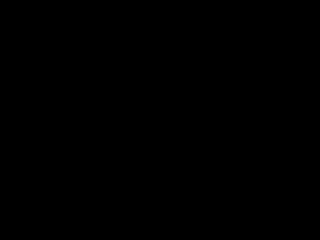

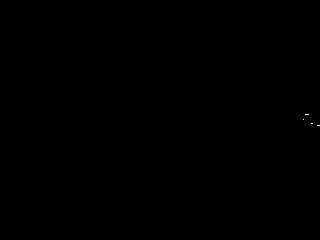

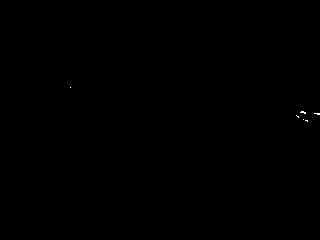

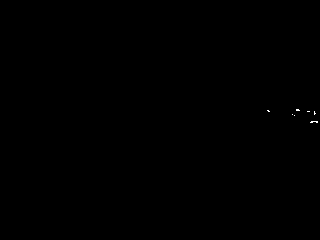

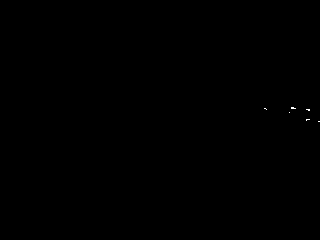

...

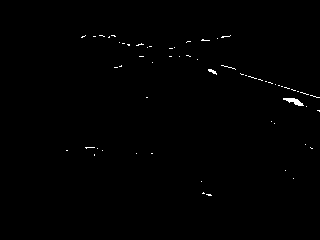

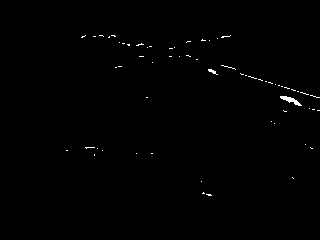

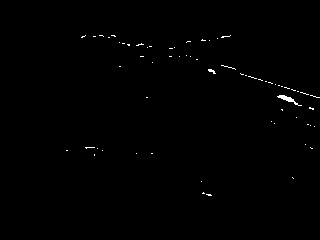

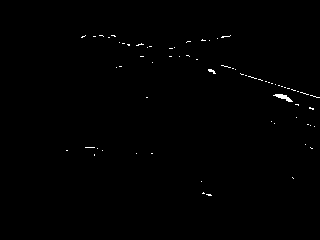

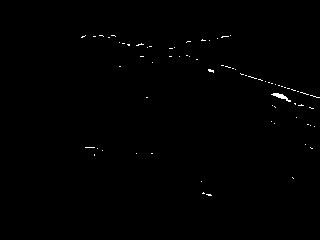

In [54]:
video = imageio.mimread('videocochescorto.mp4',memtest=False)  
#Loading video
#video = [resize(frame, (256, 256))[..., :3] for frame in video]    
#Size adjustment (if necessary)
HTML(display_video(video).to_html5_video()) #convierto el video html a video #Inline video display in HTML5

cuantos coches pasan en x tiempo

para esa pregunta solo necesito detectar los manchones/grupos de pixeles porque solo queremos contar, no queremos identificar matriculas ni nada en concreto.

trackin -> poder identificar el manchurron de pixeles en otra imagen 